In [1]:
import hypernetx as hnx
import networkx as nx
import matplotlib.pyplot as plt
import random
import numpy as np
from collections import defaultdict
import pandas as pd
from hypernetx.utils import read_write
from hypernetx import dist_stats
import sys
from hypernetx.utils.toys import HarryPotter
import hypernetx.algorithms.contagion as contagion
from IPython.display import HTML
from hnxwidget import HypernetxWidget

In [2]:
HarryPotter().harrydata

,Name,Gender,Job,House,Wand,Patronus,Species,Blood status,Hair colour,Eye colour,Loyalty,Skills,Birth,Death
0,Harry James Potter,Male,Student,Gryffindor,"11"" Holly phoenix feather",Stag,Human,Half-blood,Black,Bright green,Albus Dumbledore | Dumbledore's Army | Order o...,Parseltongue| Defence Against the Dark Arts | ...,"Thursday, July 31, 1980",NaN
1,Ronald Bilius Weasley,Male,Student,Gryffindor,"12"" Ash unicorn tail hair",Jack Russell terrier,Human,Pure-blood,Red,Blue,Dumbledore's Army | Order of the Phoenix | Hog...,Wizard chess | Quidditch goalkeeping,"Saturday, March 1, 1980",NaN
2,Hermione Jean Granger,Female,Student,Gryffindor,"10¾"" vine wood dragon heartstring",Otter,Human,Muggle-born,Brown,Brown,Dumbledore's Army | Order of the Phoenix | Hog...,Almost everything,"19 September, 1979",NaN
3,Albus Percival Wulfric Brian Dumbledore,Male,Headmaster,Gryffindor,"15"" Elder Thestral tail hair core",Phoenix,Human,Half-blood,Silver| formerly auburn,Blue,Dumbledore's Army | Order of the Phoenix | Hog...,Considered by many to be one of the most power...,Late August 1881,"30 June, 1997"
4,Rubeus Hagrid,Male,Keeper of Keys and Grounds | Professor of Care...,Gryffindor,"16"" Oak unknown core",None,Half-Human/Half-Giant,Part-Human,Black,Black,Albus Dumbledore | Order of the Phoenix | Hogw...,Resistant to stunning spells| above average st...,6 December 1928,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
135,Wilhelmina Grubbly-Plank,Female,Substitute professor of Care of Magical Creatu...,NaN,Unknown,Non-corporeal,Human,NaN,Grey,NaN,Hogwarts School of Witchcraft and Wizardry,NaN,NaN,NaN
136,Fenrir Greyback,Male,NaN,NaN,Unknown,None,Werewolf,NaN,Grey,NaN,Lord Voldemort | Death Eaters,Physical combat,Pre 1945,NaN
137,Gellert Grindelwald,Male,Revolutionary leader(c. 1920s[6]  1945),NaN,"15"", Elder, Thestral tail hair core",NaN,Human,Pure-blood or half-blood,Blond,Blue,Gellert Grindelwald's Acolytes,Duelling,"Saturday, February 25, 1905","March, 1998"
138,Dobby,Male,"Malfoy family's house-elf (? - 1993),",NaN,NaN,NaN,Elf,NaN,NaN,NaN,Hogwarts School of Witchcraft and Wizardry,NaN,NaN,NaN


In [2]:
h = read_write.read_df(HarryPotter().harrydata, edge_col="House", node_col="Job")#.collapse_nodes_and_edges()

In [4]:
HypernetxWidget(h)

HypernetxWidget(component='HypernetxWidget', props={'nodes': [{'uid': 'Student'}, {'uid': nan}, {'uid': 'Found…

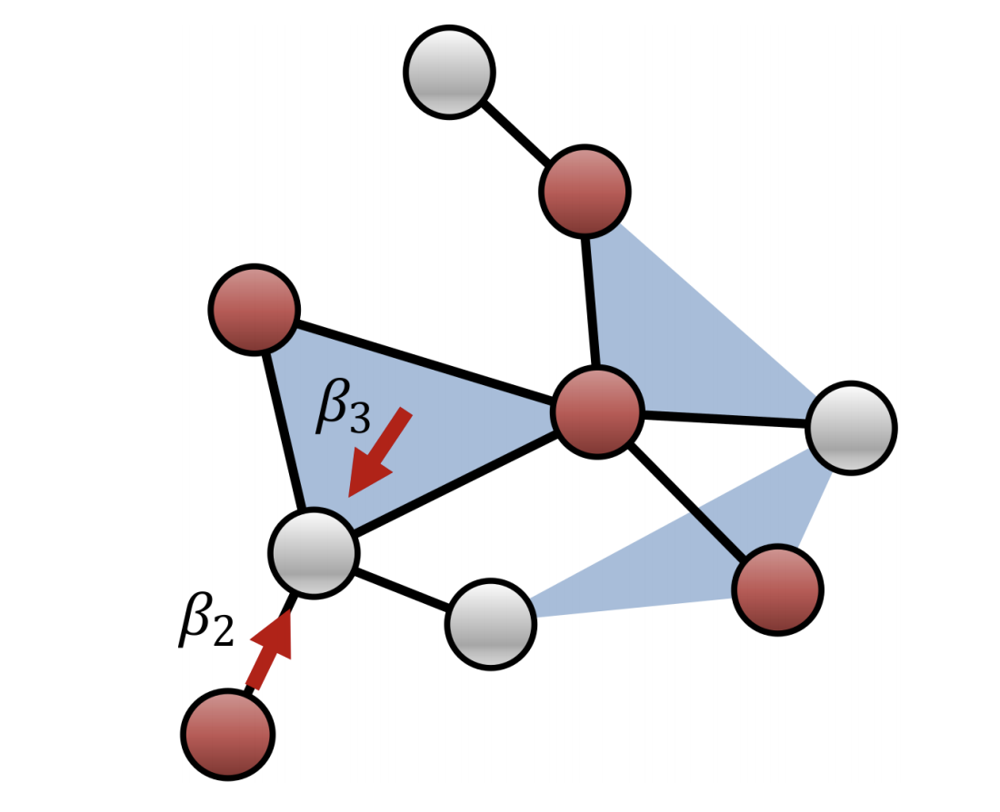

## Initialize simulation variables
- $\tau$ is a dictionary of the infection rate for each hyperedge size
- $\gamma$ is the healing rate
- $t_{max}$ is the time at which to terminate the simulation if it hasn't already
- $\Delta t$ is the time step size to use for the discrete time algorithm

In [3]:
tau = {k:0.02 for k in range(100)}
gamma = 0.01
tmax = 300
dt = 1

In [4]:
t, S, I, R = contagion.discrete_SIR(h, tau, gamma, rho=0.5, tmin=0, tmax=tmax, dt=dt)

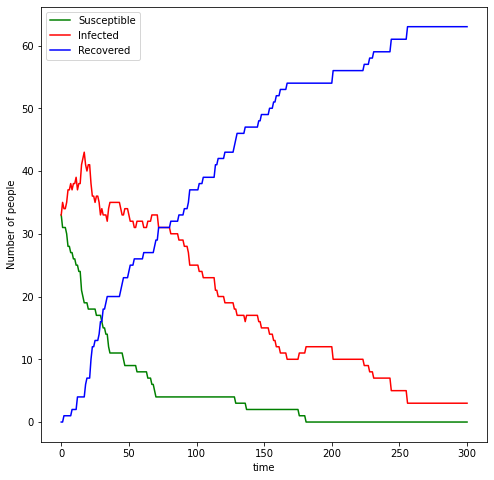

In [5]:
plt.figure()
plt.plot(t, S, color='green', label='Susceptible')
plt.plot(t, I, color='red', label='Infected')
plt.plot(t, R, color='blue', label='Recovered')
plt.ylabel("Number of people")
plt.xlabel("time")
plt.legend()
plt.show()

In [6]:
transition_events = contagion.discrete_SIR(h, tau, gamma, rho=0.5, tmin=0, tmax=tmax, dt=dt, return_full_data=True)

In [7]:
for time, events in transition_events.items():
    if events != []:
        for event in events:
            if event[0] == 'R':
                print(f"At time {time}, {event[1]} recovered")
            elif event[0] == 'I' and event[2] is not None:
                print(f"At time {time}, {event[1]} was infected by {event[2]}")

At time 3, The Servant of Lord Voldemort recovered
At time 3, Defence Against the Dark Arts(1991-1992) recovered
At time 4, Gryffindor House Ghost was infected by Gryffindor
At time 4, Founder of Slytherin was infected by Slytherin
At time 4, Professor of Potions | Head of Slytherin was infected by Slytherin
At time 5, Librarian at Hogwarts was infected by nan
At time 6, Professor of Muggle Studies recovered
At time 6, Part-time at Gringotts Wizarding Bank was infected by Beauxbatons Academy of Magic
At time 8, Owner and Barman of the Hog's Head Inn recovered
At time 10, Curse-Breaker for Gringotts Bank recovered
At time 10, Dragonologist was infected by Gryffindor
At time 10, Professor of Divination was infected by nan
At time 10, Professor of Arithmancyat Hogwarts recovered
At time 11, Keeper of Keys and Grounds | Professor of Care of Magical Creatures  was infected by Gryffindor
At time 11, Professor of Muggle Studies recovered
At time 11, Auror  was infected by nan
At time 12, Prof

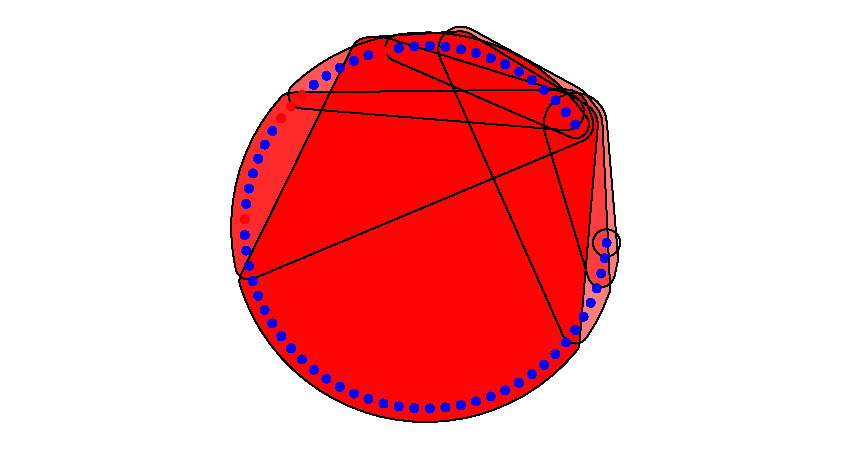

In [10]:
node_state_color_dict = {"S":"green", "I":"red", "R":"blue"}
edge_state_color_dict = {"S":(0, 1, 0, 0.3), "I":(1, 0, 0, 0.3), "R":(0, 0, 1, 0.3), "OFF": (1, 1, 1, 0)}

fps = 4

fig = plt.figure(figsize=(15,8))
transition_events = contagion.discrete_SIR(h.collapse_edges(), tau, gamma, rho=0.5, tmin=0, tmax=tmax, dt=dt, return_full_data=True)
animation = contagion.contagion_animation(fig, h.collapse_edges(), transition_events, node_state_color_dict, edge_state_color_dict, node_radius=1, fps=fps)

In [11]:
HTML(animation.to_jshtml())